<a href="https://www.kaggle.com/code/icemagic/nfl-big-data-bowl-animation?scriptVersionId=200927538" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/nfl-big-data-bowl-2025/players.csv
/kaggle/input/nfl-big-data-bowl-2025/tracking_week_7.csv
/kaggle/input/nfl-big-data-bowl-2025/tracking_week_9.csv
/kaggle/input/nfl-big-data-bowl-2025/tracking_week_6.csv
/kaggle/input/nfl-big-data-bowl-2025/games.csv
/kaggle/input/nfl-big-data-bowl-2025/tracking_week_8.csv
/kaggle/input/nfl-big-data-bowl-2025/player_play.csv
/kaggle/input/nfl-big-data-bowl-2025/tracking_week_4.csv
/kaggle/input/nfl-big-data-bowl-2025/tracking_week_3.csv
/kaggle/input/nfl-big-data-bowl-2025/tracking_week_5.csv
/kaggle/input/nfl-big-data-bowl-2025/tracking_week_1.csv
/kaggle/input/nfl-big-data-bowl-2025/plays.csv
/kaggle/input/nfl-big-data-bowl-2025/tracking_week_2.csv


# NFL Team Color Mapping

In [2]:
# Define team color mapping: {team_abbr: (primary_color_hex, secondary_color_hex)}
team_colors = {
    'ARI': ('#97233F', '#FFFFFF'),       # Arizona Cardinals: Cardinal Red, White
    'ATL': ('#000000', '#A71930'),       # Atlanta Falcons: Black, Red
    'BAL': ('#241773', '#000000'),       # Baltimore Ravens: Purple, Black
    'BUF': ('#00338D', '#C60C30'),       # Buffalo Bills: Royal Blue, Red
    'CAR': ('#0085CA', '#101820'),       # Carolina Panthers: Panther Blue, Black
    'CHI': ('#0B162A', '#C83803'),       # Chicago Bears: Navy Blue, Orange
    'CIN': ('#000000', '#FB4F14'),       # Cincinnati Bengals: Black, Orange
    'CLE': ('#311D00', '#FF3C00'),       # Cleveland Browns: Brown, Orange
    'DAL': ('#041E42', '#869397'),       # Dallas Cowboys: Navy Blue, Silver
    'DEN': ('#FB4F14', '#002244'),       # Denver Broncos: Orange, Navy Blue
    'DET': ('#0076B6', '#B0B7BC'),       # Detroit Lions: Honolulu Blue, Silver
    'GB':  ('#203731', '#FFB612'),       # Green Bay Packers: Green, Gold
    'HOU': ('#03202F', '#A71930'),       # Houston Texans: Deep Steel Blue, Battle Red
    'IND': ('#002C5F', '#FFFFFF'),       # Indianapolis Colts: Royal Blue, White
    'JAX': ('#006778', '#101820'),       # Jacksonville Jaguars: Teal, Black
    'KC':  ('#E31837', '#FFB612'),       # Kansas City Chiefs: Red, Gold
    'LV':  ('#000000', '#A5ACAF'),       # Las Vegas Raiders: Black, Silver
    'LAC': ('#0080C6', '#FFC20E'),       # Los Angeles Chargers: Powder Blue, Gold
    'LAR': ('#003594', '#FFA300'),       # Los Angeles Rams: Royal Blue, Yellow
    'MIA': ('#008E97', '#F58220'),       # Miami Dolphins: Aqua, Orange
    'MIN': ('#4F2683', '#FFC62F'),       # Minnesota Vikings: Purple, Gold
    'NE':  ('#002244', '#C60C30'),       # New England Patriots: Navy Blue, Red
    'NO':  ('#101820', '#D3BC8D'),       # New Orleans Saints: Black, Gold
    'NYG': ('#0B2265', '#A71930'),       # New York Giants: Royal Blue, Red
    'NYJ': ('#203731', '#FFFFFF'),       # New York Jets: Gotham Green, White
    'PHI': ('#004C54', '#A5ACAF'),       # Philadelphia Eagles: Midnight Green, Silver
    'PIT': ('#000000', '#FFB612'),       # Pittsburgh Steelers: Black, Gold
    'SF':  ('#AA0000', '#B3995D'),       # San Francisco 49ers: Red, Gold
    'SEA': ('#002244', '#69BE28'),       # Seattle Seahawks: Navy Blue, Action Green
    'TB':  ('#D50A0A', '#2D2D2D'),       # Tampa Bay Buccaneers: Red, Pewter
    'TEN': ('#0C2340', '#4B92DB'),       # Tennessee Titans: Navy Blue, Titans Blue
    'WAS': ('#773141', '#FFB612'),       # Washington Commanders: Burgundy, Gold
    'football': ('#964B00', '#FFFFFF')   # Football: Brown, White
}

# Importing Libraries

In [3]:
# Importing Libraries
import numpy as np
import pandas as pd
import os
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image
import matplotlib.patches as mpatches
import imageio.v2 as imageio  # Updated import to address DeprecationWarning

# Load data

In [4]:
path = '/kaggle/input/nfl-big-data-bowl-2025/tracking_week_1.csv'
data0 = pd.read_csv(path)
games = data0['gameId'].unique().tolist()
data = data0[data0['gameId'] == games[0]]
display(data)

,gameId,playId,nflId,displayName,frameId,frameType,time,jerseyNumber,club,playDirection,x,y,s,a,dis,o,dir,event
0,2022091200,64,35459.0,Kareem Jackson,1,BEFORE_SNAP,2022-09-13 00:16:03.5,22.0,DEN,right,51.060000,28.550000,0.72,0.37,0.07,246.17,68.34,huddle_break_offense
1,2022091200,64,35459.0,Kareem Jackson,2,BEFORE_SNAP,2022-09-13 00:16:03.6,22.0,DEN,right,51.130000,28.570000,0.71,0.36,0.07,245.41,71.21,NaN
2,2022091200,64,35459.0,Kareem Jackson,3,BEFORE_SNAP,2022-09-13 00:16:03.7,22.0,DEN,right,51.200000,28.590000,0.69,0.23,0.07,244.45,69.90,NaN
3,2022091200,64,35459.0,Kareem Jackson,4,BEFORE_SNAP,2022-09-13 00:16:03.8,22.0,DEN,right,51.260000,28.620000,0.67,0.22,0.07,244.45,67.98,NaN
4,2022091200,64,35459.0,Kareem Jackson,5,BEFORE_SNAP,2022-09-13 00:16:03.9,22.0,DEN,right,51.320000,28.650000,0.65,0.34,0.07,245.74,62.83,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
435960,2022091200,4012,NaN,football,59,AFTER_SNAP,2022-09-13 03:09:23.5,NaN,football,right,63.439999,23.990000,0.84,3.01,0.07,NaN,NaN,qb_kneel
435961,2022091200,4012,NaN,football,60,AFTER_SNAP,2022-09-13 03:09:23.6,NaN,football,right,63.340000,23.990000,1.15,2.85,0.10,NaN,NaN,NaN
435962,2022091200,4012,NaN,football,61,AFTER_SNAP,2022-09-13 03:09:23.7,NaN,football,right,63.220001,23.990000,1.40,2.64,0.12,NaN,NaN,NaN
435963,2022091200,4012,NaN,football,62,AFTER_SNAP,2022-09-13 03:09:23.8,NaN,football,right,63.080002,24.000000,1.53,1.62,0.14,NaN,NaN,NaN


# Extract unique times and teams

In [5]:
times = sorted(data['time'].unique().tolist())
names = data['club'].unique().tolist()
print(names)

['DEN', 'SEA', 'football']


# Create frames directory if not exists

In [6]:
os.makedirs('frames', exist_ok=True)

# Function to draw football field

In [7]:
# Function to draw football field
def draw_football_field(ax):
    # Field lines
    ax.plot([0, 120], [0, 0], color='white', linewidth=2)
    ax.plot([0, 120], [53.3, 53.3], color='white', linewidth=2)
    ax.plot([10, 10], [0, 53.3], color='white', linewidth=2)
    ax.plot([110, 110], [0, 53.3], color='white', linewidth=2)
    ax.plot([60, 60], [0, 53.3], color='white', linewidth=2)

    # End zones
    ax.axvspan(0, 10, facecolor='blue', alpha=0.2, label='Home')
    ax.axvspan(110, 120, facecolor='red', alpha=0.2, label='Visitor')

    # Yard lines
    for x in range(20, 110, 10):
        ax.plot([x, x], [0, 53.3], color='white', linestyle='--', linewidth=1)

    # Remove axes
    ax.axis('off')

# Function to get color pair for a team

In [8]:
# Function to get color pair for a team
def get_color_pair(team):
    return team_colors.get(team, ('#FFFFFF', '#000000'))  # Default to white and black

# Initialize legend patches


In [9]:
# Initialize legend patches
legend_patches = []

# Define frame skip and DPI

In [10]:
# Define frame skip and DPI
frame_skip = 20  # Adjusted frame skip for fewer frames
save_dpi = 100   # Lowered DPI for faster saving

# Iterate through times and create frames

In [11]:
# Iterate through times and create frames
for i, t in enumerate(times):
    if i % frame_skip != 0:
        continue

    datai = data[data['time'] == t].reset_index(drop=True)

    # Create figure with green background
    fig, ax = plt.subplots(figsize=(20, 10), facecolor='#3CB371')  # Set figure facecolor to green

    draw_football_field(ax)

    # Plot players with primary color as facecolor and secondary color as edgecolor
    for team in team_colors.keys():
        team_data = datai[datai['club'] == team]
        if team_data.empty:
            continue
        primary_color, secondary_color = get_color_pair(team)

        # Define marker properties
        if team == 'football':
            marker = 's'  # Square marker for football
            size = 300    # Larger size
            edge_width = 2
        else:
            marker = 'o'  # Circle marker for players
            size = 100    # Standard size
            edge_width = 1

        # Plot scatter with facecolor and edgecolor
        sc = ax.scatter(
            team_data['x'],
            team_data['y'],
            c=team_data['club'].apply(lambda x: primary_color),
            edgecolors=team_data['club'].apply(lambda x: secondary_color),
            linewidth=edge_width,
            s=size,
            marker=marker,
            zorder=5
        )

        # Add player jersey numbers
        for _, row in team_data.iterrows():
            if pd.notnull(row['displayName']) and pd.notnull(row['jerseyNumber']):
                ax.text(
                    row['x'] + 0.3,
                    row['y'] + 0.3,
                    int(row['jerseyNumber']),
                    fontsize=6,  # Reduced fontsize
                    color='black',
                    ha='center'
                )

    # Add title with time
    ax.set_title(f'Time: {t}', fontsize=20, pad=30)

    # Add progress indicator
    progress = (i / len(times)) * 100
    ax.text(60, 54, f'Progress: {progress:.2f}%', fontsize=14, color='black', ha='center')

    # Create legend only once
    if i == 0:
        for team, (primary, secondary) in team_colors.items():
            if team == 'football':
                label = 'Football'
            else:
                label = team
            patch = mpatches.Patch(facecolor=primary, edgecolor=secondary, label=label)
            legend_patches.append(patch)
        # Add legend outside the field
        ax.legend(handles=legend_patches, loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)

        # Adjust subplot to make room for the legend
        plt.subplots_adjust(right=0.85)  # Increased right margin

    # Remove any additional padding that might introduce white space
    plt.tight_layout(pad=3.0)  # Increased padding to accommodate external legend

    # Save the frame with the figure's facecolor
    plt.savefig(f'frames/frame_{i:06d}.png', dpi=save_dpi, facecolor=fig.get_facecolor())
    plt.close(fig)

# Collect all frame paths

In [12]:
# Collect all frame paths
frame_paths = [f'frames/frame_{i:06d}.png' for i in range(0, len(times), frame_skip)]

# Create a list of images

In [13]:
# Create a list of images
images = []
for frame_path in frame_paths:
    if os.path.exists(frame_path):
        images.append(imageio.imread(frame_path))

In [14]:
# Save as GIF using imageio for potentially faster processing
imageio.mimsave('tracking_enhanced.gif', images, duration=0.1)  # duration in seconds

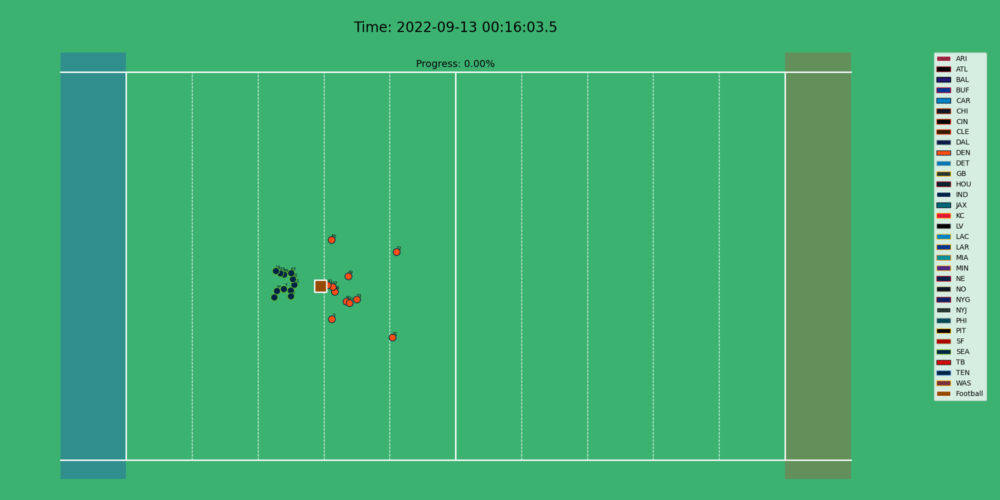

In [15]:
# Display the GIF
from IPython.display import Image as IPImage
with open('tracking_enhanced.gif','rb') as f:
    display(IPImage(data=f.read()))

----------------------